# Interactive feature matching

In [1]:
import sys
sys.path.append('..')

from multiview_stitcher import spatial_image_utils as si_utils

from muvis_align.MVSRegistration import MVSRegistration
from muvis_align.util import dir_regex
from muvis_align.image.util import get_sim_physical_size, draw_keypoints_matches

## Setup parameters

In [4]:
params = {
	'general':
	{
        'ui': 'mpl',
        'debug': True
	},
	'operations':
	[
		{
			'operation': 'stack',
			'input': ['D:/slides/EM04652-02_slice17_spaghettiandmeatballs2/overviews/ov000/EM04652-02_slice17_spaghettiandmeatballs2_ov000_s00000.ome.tif',
                      'D:/slides/EM04652-02_slice17_spaghettiandmeatballs2/overviews/ov000/EM04652-02_slice17_spaghettiandmeatballs2_ov000_s00001.ome.tif'],
			'source_metadata': 'sbemimage',
            'use_orthogonal_pairs': True,
            'n_parallel_pairwise_regs': 1,
			'output': '../../output/'
		}
	]
}


## Initialise muvis-align, initialise sims, and pre-process

In [21]:
operation_params = params['operations'][0]
filenames = dir_regex(operation_params['input'])

reg = MVSRegistration(params['general'])
reg.init_operation('', filenames, operation_params)
sims = reg.init_sims()
norm_sims, _ = reg.preprocess(sims, operation_params)

for label, sim in zip(reg.file_labels, sims):
    print(label, sim.shape, si_utils.get_origin_from_sim(sim), get_sim_physical_size(sim))

s00000 (1, 1, 3072, 4096) {'y': 68.959, 'x': 245.584} {'y': 758.6208849557588, 'x': 1011.4945132742869}
s00001 (1, 1, 3072, 4096) {'y': 68.959, 'x': 245.584} {'y': 758.6208849557588, 'x': 1011.4945132742869}


## Get overlap between tiles

Overlap size [um]: [ 758.62088496 1011.49451327]


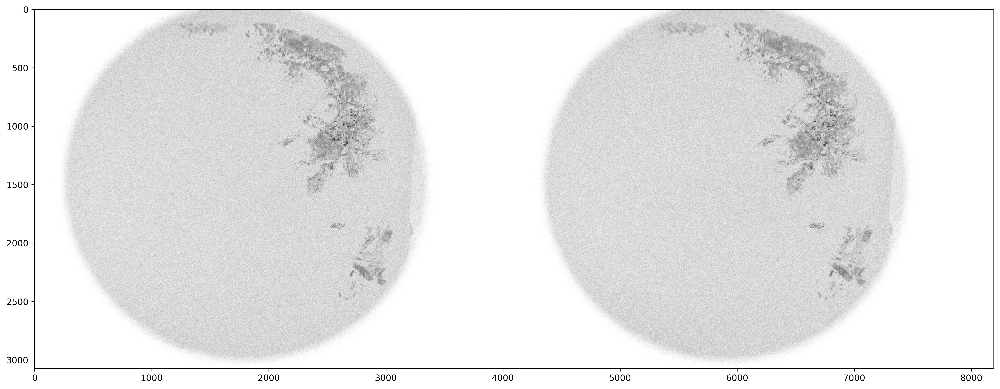

(<Figure size 4800x2400 with 1 Axes>, <Axes: >)

In [22]:
%matplotlib inline
overlap1, overlap2 = reg.get_overlap_images(norm_sims[0], norm_sims[1], reg.source_transform_key)
overlap1, overlap2 = overlap1.squeeze().compute(), overlap2.squeeze().compute()
print('Overlap size [um]:', overlap1.shape * si_utils.get_spacing_from_sim(sims[0], asarray=True))
draw_keypoints_matches(overlap1, [], overlap2, [])

## Interactive: Set up feature extraction and matching, and show results

### You can modify the parameters and rerun this cell to update results, e.g.:

**transform_type**: affine, euclidean, translation

**name**: sift, orb

norm translation [-0.00026141  0.00018417] norm SD 0.00011622729875929729
%inliers 0.9148673658235656 #good ransac iterations 3
#keypoints: 5000,5000 #matches: 1621 #inliers: 1483 quality: 0.667


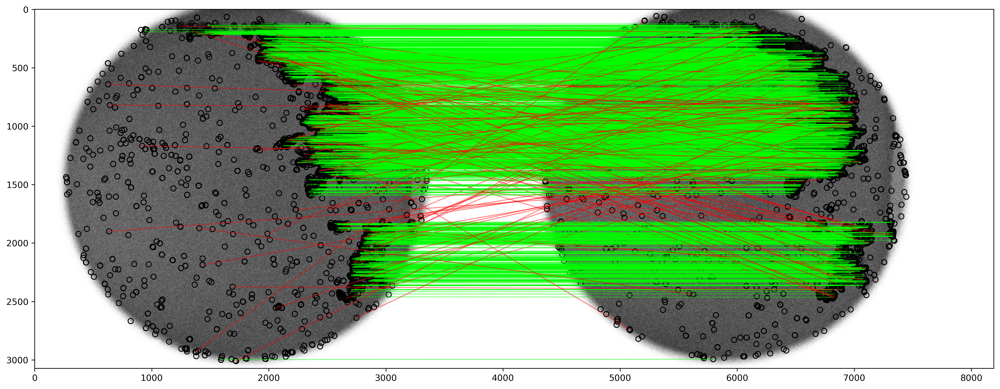

transform:
 [[ 9.99999946e-01  3.28085399e-04 -1.27008029e+00]
 [-3.28085399e-04  9.99999946e-01  6.35663946e-01]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


In [23]:
%matplotlib inline
reg.params.update({
    'transform_type': 'affine',
    'method': {
        'name': 'orb',
        'gaussian_sigma': 2.5,
        'max_keypoints': 5000,
        'inlier_threshold_factor': 0.05,
        'max_trials': 1000,
        'ransac_iterations': 3
    }
})

reg_method, pairwise_reg_func, pairwise_reg_func_kwargs = reg.create_registration_method(sims[0])
result = pairwise_reg_func(overlap1, overlap2)
print('transform:\n', result['affine_matrix'])

## Run registration on all tiles, showing results corresponding to each tile overlap

In [ ]:
%matplotlib inline
reg.register(sims, norm_sims)